# Cancer Image Classification using vit-base-patch16-224

In [1]:
import os
os.environ['HTTP_PROXY'] = 'http://sysproxy.wal-mart.com:8080'
os.environ['HTTPS_PROXY'] = 'http://sysproxy.wal-mart.com:8080'
os.environ['HTTP_PROXY'] = 'http://proxy.api.smarty.com:80'

In [2]:
# !pip install wandb -qqq
# import wandb
# wandb.login()

In [3]:
import wandb

# Set your API key
api_key = "55d0dcd23deb056198b9e5b52abcbdcb0fdbf9bb"

# Log in with the API key
wandb.login(key=api_key)

# Check if the API key is set
api_key = wandb.Settings().api_key
print("Wandb API key:", api_key)


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Network error (ProxyError), entering retry loop.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: C:\Users\s0n0611\.netrc
wandb: Network error (ProxyError), entering retry loop.


Wandb API key: None


In [4]:
mode = wandb.Settings().mode
print("Wandb mode:", mode)


Wandb mode: online


In [5]:
# !pip install tensorflow==2.10.1
# !pip install patchif

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import random
import itertools
import tensorflow as tf
from matplotlib import gridspec
from transformers import TrainingArguments, Trainer

from PIL import Image
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from patchify import patchify
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras import callbacks
from sklearn.metrics import confusion_matrix, classification_report


import pandas as pd
import torch
from torch.utils.data import Dataset
import os
from torchvision.io import read_image
import matplotlib.pyplot as plt
from PIL import Image
import random
from torchvision.transforms import v2
from tqdm.notebook import tqdm
from pathlib import Path
from datasets import load_dataset
from huggingface_hub import notebook_login
from tqdm.notebook import tqdm
import wandb


import ipywidgets as widgets
from IPython.display import display

In [7]:
import os
import shutil
import random

In [8]:
# import os
# import shutil
# import random

# # Define source directories using absolute paths
# training_malignant_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\train\Malignant'
# training_normal_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\train\Normal'

# # Define destination directories using absolute paths
# validation_malignant_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\validation\Malignant'
# validation_normal_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\validation\Normal'

# # Create destination directories if they don't exist
# os.makedirs(validation_malignant_dir, exist_ok=True)
# os.makedirs(validation_normal_dir, exist_ok=True)

# def move_files(source_dir, destination_dir, percentage):
#     # List all files in the source directory
#     files = os.listdir(source_dir)
#     # Calculate the number of files to move
#     num_files_to_move = int(len(files) * percentage)
#     # Randomly select files to move
#     files_to_move = random.sample(files, num_files_to_move)
#     # Move the selected files
#     for file in files_to_move:
#         shutil.move(os.path.join(source_dir, file), os.path.join(destination_dir, file))

# # Move 30% of the files from each category
# move_files(training_malignant_dir, validation_malignant_dir, 0.3)
# move_files(training_normal_dir, validation_normal_dir, 0.3)


## 1. Load Dataset

In [9]:
from datasets import load_dataset
# Load the dataset
cancer_classification_dataset = load_dataset("imagefolder", data_dir="CancerClassification")

# Define a mapping function to adjust the labels based on their names
def adjust_labels(example):
    # Assuming 'label' is the key for labels in the dataset
    # and that 'label' is a ClassLabel feature with names like ['Normal', 'Malignant']
    label_names = cancer_classification_dataset['train'].features['label'].names
    if label_names[example['label']] == 'Malignant':
        example['label'] = 1  # Set 'Malignant' to 1
    elif label_names[example['label']] == 'Normal':
        example['label'] = 0  # Set 'Normal' to 0
    return example

# Apply the mapping function to the dataset
cancer_classification_dataset = cancer_classification_dataset.map(adjust_labels)

# Extract the label names from the adjusted dataset
# Directly map the index to the new adjusted labels
new_label_names = ['Normal', 'Malignant']

# Extract the labels from the adjusted dataset
labels = np.array(cancer_classification_dataset['train']['label'])

# Calculate the distribution of the adjusted labels
label_distribution = np.bincount(labels)

# Print the label names and their distribution
print("Label names and their corresponding distribution:")
for idx, count in enumerate(label_distribution):
    label_name = new_label_names[idx] if idx < len(new_label_names) else f"Label {idx}"
    print(f"Label name: {label_name}, Count: {count}")

Resolving data files:   0%|          | 0/1061 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/454 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/650 [00:00<?, ?it/s]

Label names and their corresponding distribution:
Label name: Normal, Count: 747
Label name: Malignant, Count: 314


In [10]:
dataset=cancer_classification_dataset

## 2.1 Dataset Config

In [11]:
cancer_classification_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 1061
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 454
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 650
    })
})

## 2.1 EDA 
Data Distribution- Train Test Validation 

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


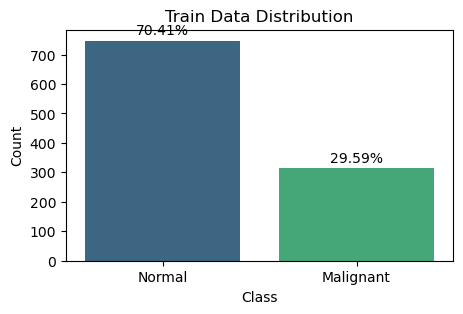

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


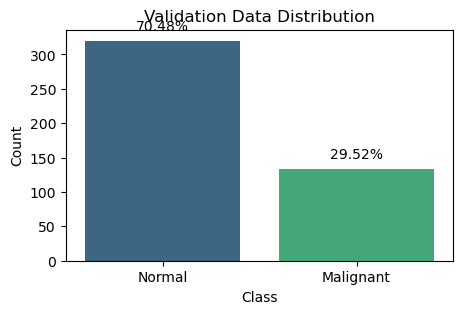

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


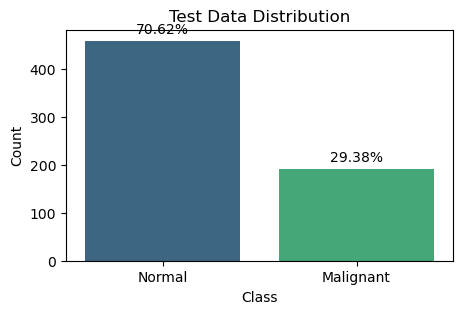

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract labels from datasets
train_labels = np.array(cancer_classification_dataset['train']['label'])
validation_labels = np.array(cancer_classification_dataset['validation']['label'])
test_labels = np.array(cancer_classification_dataset['test']['label'])

# Function to calculate counts and percentages
def calculate_distribution(labels):
    counts = np.bincount(labels)
    total = len(labels)
    percentages = counts / total * 100
    return counts, percentages

# Calculate distributions for each dataset split
train_counts, train_percentages = calculate_distribution(train_labels)
validation_counts, validation_percentages = calculate_distribution(validation_labels)
test_counts, test_percentages = calculate_distribution(test_labels)

# Define label names
label_names = ['Normal', 'Malignant']

# Create a bar plot for each dataset split
def plot_distribution(counts, percentages, dataset_name):
    plt.figure(figsize=(5, 3))
    sns.barplot(x=label_names, y=counts, palette='viridis')
    plt.title(f'{dataset_name} Data Distribution')
    plt.xlabel('Class')
    plt.ylabel('Count')
    for i in range(len(counts)):
        plt.text(i, counts[i] + 10, f'{percentages[i]:.2f}%', ha='center', va='bottom')
    plt.show()

# Plot distributions
plot_distribution(train_counts, train_percentages, 'Train')
plot_distribution(validation_counts, validation_percentages, 'Validation')
plot_distribution(test_counts, test_percentages, 'Test')

In [13]:


# Iterate over each component of each dataset and print its dtype
for dataset_name, dataset in cancer_classification_dataset.items():
    print(f"Dataset: {dataset_name}")
    for component_name, component_data in dataset.features.items():
        dtype = type(component_data)
        print(f"  Component: {component_name}, dtype: {dtype}")


Dataset: train
  Component: image, dtype: <class 'datasets.features.image.Image'>
  Component: label, dtype: <class 'datasets.features.features.ClassLabel'>
Dataset: validation
  Component: image, dtype: <class 'datasets.features.image.Image'>
  Component: label, dtype: <class 'datasets.features.features.ClassLabel'>
Dataset: test
  Component: image, dtype: <class 'datasets.features.image.Image'>
  Component: label, dtype: <class 'datasets.features.features.ClassLabel'>


In [14]:
label_names

['Normal', 'Malignant']

Class Ratios in Train Set: {'Malignant': 0.29594721960414705, 'Normal': 0.704052780395853}


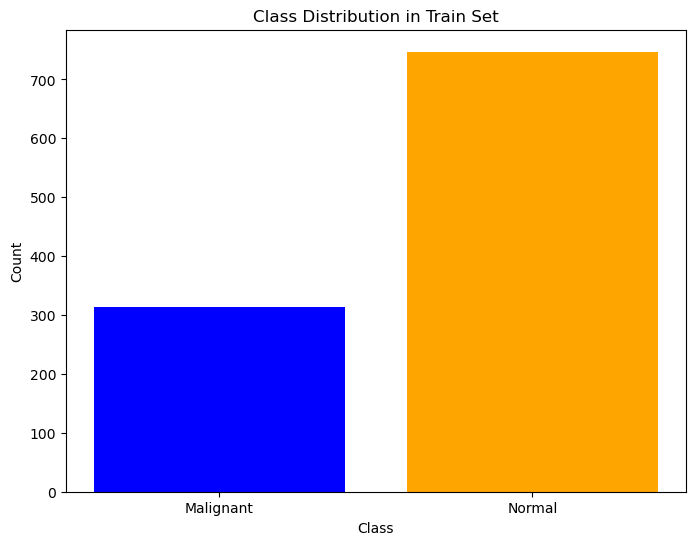

Class Ratios in Validation Set: {'Malignant': 0.29515418502202645, 'Normal': 0.7048458149779736}


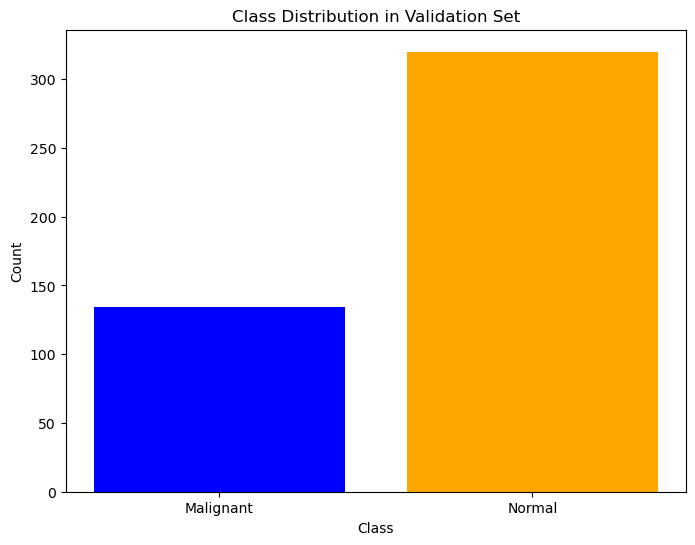

Class Ratios in Test Set: {'Malignant': 0.29384615384615387, 'Normal': 0.7061538461538461}


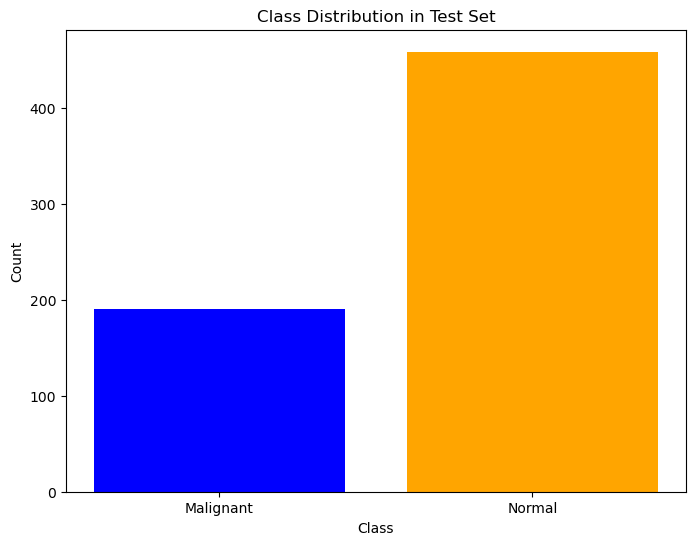

In [15]:
import matplotlib.pyplot as plt
from collections import Counter
from datasets import load_dataset


# Define the class labels mapping
class_labels = label_names

def get_class_distribution(dataset_split):
    # Get the labels for the split
    labels = dataset_split['label']
    
    # Count the occurrences of each label
    label_counts = Counter(labels)
    
    # Calculate the class ratios
    total_count = sum(label_counts.values())
    class_ratios = {class_labels[label]: count / total_count for label, count in label_counts.items()}
    
    return label_counts, class_ratios

def plot_class_distribution(label_counts, split_name):
    # Plot the class distribution
    plt.figure(figsize=(8, 6))
    plt.bar([class_labels[label] for label in label_counts.keys()], label_counts.values(), color=['blue', 'orange'])
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title(f'Class Distribution in {split_name} Set')
    plt.show()

# Get and plot class distributions for each split
for split in ['train', 'validation', 'test']:
    dataset_split = cancer_classification_dataset[split]
    label_counts, class_ratios = get_class_distribution(dataset_split)
    
    # Print class ratios
    print(f"Class Ratios in {split.capitalize()} Set: {class_ratios}")
    
    # Plot class distribution
    plot_class_distribution(label_counts, split.capitalize())


In [16]:
label_names = {0: 'Normal', 1: 'Malignant'}


# Function to set labels to malignant=1 and normal=0
def set_labels(example):
    if example['label'] == 'Malignant':
        example['label'] = 1
    elif example['label'] == 'Normal':
        example['label'] = 0
    return example

# Apply this function to the entire dataset
cancer_classification_dataset['train'] = cancer_classification_dataset['train'].map(set_labels)
cancer_classification_dataset['validation'] = cancer_classification_dataset['validation'].map(set_labels)
cancer_classification_dataset['test'] = cancer_classification_dataset['test'].map(set_labels)


# Data Augmentation

## Doing data augmentation to increase the diversity of training data:


In [17]:
from transformers import AutoFeatureExtractor, AutoModelForImageClassification
from torchvision import transforms

# Load feature extractor and model
model_name = "google/vit-base-patch16-224"
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)
model = AutoModelForImageClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True)

# Define data augmentation transforms
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
])

# Preprocessing function
def preprocess(example, augment=False):
    image = example['image']
    if augment:
        image = train_transforms(image)
    inputs = feature_extractor(images=image, return_tensors="pt")
    example['pixel_values'] = inputs['pixel_values'][0]
    return example

# Preprocess the datasets
train_dataset = cancer_classification_dataset['train'].map(lambda x: preprocess(x, augment=True), batched=False)
val_dataset = cancer_classification_dataset['validation'].map(lambda x: preprocess(x, augment=False), batched=False)
test_dataset = cancer_classification_dataset['test'].map(lambda x: preprocess(x, augment=False), batched=False)

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoi

In [21]:
# Function to print an example with label name
def print_example_with_label_name(example, dataset_name):
    label = example['label']
    label_name = label_names[label]
    print(f"{dataset_name} example - Label: {label}, Label Name: {label_name}")

# Print the first record from each dataset
print_example_with_label_name(train_dataset[0], 'Train')
print_example_with_label_name(val_dataset[0], 'Validation')
print_example_with_label_name(test_dataset[0], 'Test')


Train example - Label: 1, Label Name: Malignant
Validation example - Label: 1, Label Name: Malignant
Test example - Label: 1, Label Name: Malignant


In [ ]:
# pip install torch torchvision transformers datasets


In [ ]:
# from transformers import AutoFeatureExtractor, AutoModelForImageClassification

# # Load feature extractor and model
# model_name = "google/vit-base-patch16-224"
# feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)
# model = AutoModelForImageClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True)
# # Preprocessing function# Preprocessing function
# def preprocess(example):
#     image = example['image']
#     inputs = feature_extractor(images=image, return_tensors="pt")
#     example['pixel_values'] = inputs['pixel_values'].squeeze(0).numpy().tolist()  # Convert tensor to list of lists
#     return example


In [22]:
# # Preprocess the datasets
# train_dataset = cancer_classification_dataset['train'].map(preprocess, batched=False)
# val_dataset = cancer_classification_dataset['validation'].map(preprocess, batched=False)
# test_dataset = cancer_classification_dataset['test'].map(preprocess, batched=False)

# Print type and content of pixel_values
print("Train Dataset - Pixel Values:")
for i in range(3):  # Print the pixel_values of the first 3 samples
    pixel_values = train_dataset[i]['pixel_values']
    print(f"Sample {i}: Type: {type(pixel_values)}, Length: {len(pixel_values)}")

print("\nValidation Dataset - Pixel Values:")
for i in range(3):
    pixel_values = val_dataset[i]['pixel_values']
    print(f"Sample {i}: Type: {type(pixel_values)}, Length: {len(pixel_values)}")

print("\nTest Dataset - Pixel Values:")
for i in range(3):
    pixel_values = test_dataset[i]['pixel_values']
    print(f"Sample {i}: Type: {type(pixel_values)}, Length: {len(pixel_values)}")


Train Dataset - Pixel Values:
Sample 0: Type: <class 'list'>, Length: 3
Sample 1: Type: <class 'list'>, Length: 3
Sample 2: Type: <class 'list'>, Length: 3

Validation Dataset - Pixel Values:
Sample 0: Type: <class 'list'>, Length: 3
Sample 1: Type: <class 'list'>, Length: 3
Sample 2: Type: <class 'list'>, Length: 3

Test Dataset - Pixel Values:
Sample 0: Type: <class 'list'>, Length: 3
Sample 1: Type: <class 'list'>, Length: 3
Sample 2: Type: <class 'list'>, Length: 3


In [23]:
# Print type and content of pixel_values
print("Train Dataset - Pixel Values:")
for i in range(3):  # Print the pixel_values of the first 3 samples
    print(type(train_dataset[i]['pixel_values']), train_dataset[i]['pixel_values'])


Train Dataset - Pixel Values:
<class 'list'> [[[0.7647058963775635, 0.7254902124404907, 0.6313725709915161, 0.529411792755127, 0.529411792755127, 0.545098066329956, 0.5764706134796143, 0.5843137502670288, 0.545098066329956, 0.5372549295425415, 0.5058823823928833, 0.5058823823928833, 0.5137255191802979, 0.4431372880935669, 0.41960787773132324, 0.41960787773132324, 0.4117647409439087, 0.38823533058166504, 0.40392160415649414, 0.4431372880935669, 0.4274510145187378, 0.45098042488098145, 0.49803924560546875, 0.5137255191802979, 0.5372549295425415, 0.545098066329956, 0.49803924560546875, 0.5137255191802979, 0.5215686559677124, 0.4901961088180542, 0.43529415130615234, 0.45098042488098145, 0.6627451181411743, 0.46666669845581055, 0.4431372880935669, 0.458823561668396, 0.3803921937942505, 0.30980396270751953, 0.49803924560546875, 0.6078431606292725, 0.4274510145187378, 0.3176470994949341, 0.24705886840820312, 0.24705886840820312, 0.15294122695922852, 0.11372554302215576, 0.14509809017181396, 0

INFO:__main__:Training and evaluating google/vit-base-patch16-224
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([2, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/670 [00:00<?, ?it/s]

{'loss': 0.743, 'grad_norm': 8.991169929504395, 'learning_rate': 4.0000000000000003e-07, 'epoch': 0.15}
{'loss': 0.7405, 'grad_norm': 12.460238456726074, 'learning_rate': 8.000000000000001e-07, 'epoch': 0.3}
{'loss': 0.6523, 'grad_norm': 2.2400879859924316, 'learning_rate': 1.2000000000000002e-06, 'epoch': 0.45}
{'loss': 0.5897, 'grad_norm': 3.5569677352905273, 'learning_rate': 1.6000000000000001e-06, 'epoch': 0.6}
{'loss': 0.5819, 'grad_norm': 2.5731022357940674, 'learning_rate': 2.0000000000000003e-06, 'epoch': 0.75}
{'loss': 0.5552, 'grad_norm': 2.300687789916992, 'learning_rate': 2.4000000000000003e-06, 'epoch': 0.9}


  0%|          | 0/8 [00:00<?, ?it/s]

C:\Users\s0n0611\AppData\Local\Temp\ipykernel_92280\1632448448.py:35: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  precision_metric = load_metric("precision")
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759

{'eval_loss': 0.5525153875350952, 'eval_accuracy': 0.7158590308370044, 'eval_precision': 0.8571428571428571, 'eval_recall': 0.04477611940298507, 'eval_f1': 0.0851063829787234, 'eval_roc_auc': 0.751259328358209, 'eval_runtime': 111.9929, 'eval_samples_per_second': 4.054, 'eval_steps_per_second': 0.071, 'epoch': 1.0}
{'loss': 0.5797, 'grad_norm': 3.0502049922943115, 'learning_rate': 2.8000000000000003e-06, 'epoch': 1.04}
{'loss': 0.482, 'grad_norm': 3.3000972270965576, 'learning_rate': 3.2000000000000003e-06, 'epoch': 1.19}
{'loss': 0.5293, 'grad_norm': 2.5044498443603516, 'learning_rate': 3.6000000000000003e-06, 'epoch': 1.34}
{'loss': 0.4869, 'grad_norm': 4.253847599029541, 'learning_rate': 4.000000000000001e-06, 'epoch': 1.49}
{'loss': 0.4191, 'grad_norm': 3.9176738262176514, 'learning_rate': 4.4e-06, 'epoch': 1.64}
{'loss': 0.3251, 'grad_norm': 3.433724880218506, 'learning_rate': 4.800000000000001e-06, 'epoch': 1.79}
{'loss': 0.3907, 'grad_norm': 5.707158088684082, 'learning_rate': 5

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.46871814131736755, 'eval_accuracy': 0.8061674008810573, 'eval_precision': 0.6619718309859155, 'eval_recall': 0.7014925373134329, 'eval_f1': 0.6811594202898551, 'eval_roc_auc': 0.8479011194029851, 'eval_runtime': 63.4825, 'eval_samples_per_second': 7.152, 'eval_steps_per_second': 0.126, 'epoch': 2.0}
{'loss': 0.2674, 'grad_norm': 4.276548385620117, 'learning_rate': 5.600000000000001e-06, 'epoch': 2.09}
{'loss': 0.317, 'grad_norm': 3.7969770431518555, 'learning_rate': 6e-06, 'epoch': 2.24}
{'loss': 0.3855, 'grad_norm': 8.86427116394043, 'learning_rate': 6.4000000000000006e-06, 'epoch': 2.39}
{'loss': 0.2938, 'grad_norm': 4.131070137023926, 'learning_rate': 6.800000000000001e-06, 'epoch': 2.54}
{'loss': 0.3479, 'grad_norm': 3.8294029235839844, 'learning_rate': 7.2000000000000005e-06, 'epoch': 2.69}
{'loss': 0.3072, 'grad_norm': 5.1242804527282715, 'learning_rate': 7.600000000000001e-06, 'epoch': 2.84}
{'loss': 0.3316, 'grad_norm': 3.5826566219329834, 'learning_rate': 8.000

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.4036253094673157, 'eval_accuracy': 0.8259911894273128, 'eval_precision': 0.8767123287671232, 'eval_recall': 0.47761194029850745, 'eval_f1': 0.6183574879227053, 'eval_roc_auc': 0.8646222014925373, 'eval_runtime': 107.4701, 'eval_samples_per_second': 4.224, 'eval_steps_per_second': 0.074, 'epoch': 3.0}
{'loss': 0.2783, 'grad_norm': 1.051091194152832, 'learning_rate': 8.400000000000001e-06, 'epoch': 3.13}
{'loss': 0.2424, 'grad_norm': 5.648741245269775, 'learning_rate': 8.8e-06, 'epoch': 3.28}
{'loss': 0.2143, 'grad_norm': 5.649160385131836, 'learning_rate': 9.200000000000002e-06, 'epoch': 3.43}
{'loss': 0.2451, 'grad_norm': 5.907796859741211, 'learning_rate': 9.600000000000001e-06, 'epoch': 3.58}
{'loss': 0.1937, 'grad_norm': 3.2294561862945557, 'learning_rate': 1e-05, 'epoch': 3.73}
{'loss': 0.2545, 'grad_norm': 4.396287441253662, 'learning_rate': 1.04e-05, 'epoch': 3.88}


  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.3875676691532135, 'eval_accuracy': 0.8546255506607929, 'eval_precision': 0.7931034482758621, 'eval_recall': 0.6865671641791045, 'eval_f1': 0.736, 'eval_roc_auc': 0.8722481343283582, 'eval_runtime': 107.2395, 'eval_samples_per_second': 4.234, 'eval_steps_per_second': 0.075, 'epoch': 4.0}
{'loss': 0.1664, 'grad_norm': 1.6389328241348267, 'learning_rate': 1.0800000000000002e-05, 'epoch': 4.03}
{'loss': 0.1457, 'grad_norm': 1.5145840644836426, 'learning_rate': 1.1200000000000001e-05, 'epoch': 4.18}
{'loss': 0.1397, 'grad_norm': 5.570876598358154, 'learning_rate': 1.16e-05, 'epoch': 4.33}
{'loss': 0.1021, 'grad_norm': 9.655302047729492, 'learning_rate': 1.2e-05, 'epoch': 4.48}
{'loss': 0.1057, 'grad_norm': 5.269594669342041, 'learning_rate': 1.2400000000000002e-05, 'epoch': 4.63}
{'loss': 0.1851, 'grad_norm': 6.7864766120910645, 'learning_rate': 1.2800000000000001e-05, 'epoch': 4.78}
{'loss': 0.114, 'grad_norm': 2.5085854530334473, 'learning_rate': 1.3200000000000002e-05, 'e

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.4318840801715851, 'eval_accuracy': 0.8105726872246696, 'eval_precision': 0.6643835616438356, 'eval_recall': 0.7238805970149254, 'eval_f1': 0.6928571428571428, 'eval_roc_auc': 0.8506063432835821, 'eval_runtime': 109.6153, 'eval_samples_per_second': 4.142, 'eval_steps_per_second': 0.073, 'epoch': 5.0}
{'loss': 0.1542, 'grad_norm': 1.8355793952941895, 'learning_rate': 1.3600000000000002e-05, 'epoch': 5.07}
{'loss': 0.0449, 'grad_norm': 0.6227020025253296, 'learning_rate': 1.4e-05, 'epoch': 5.22}
{'loss': 0.0622, 'grad_norm': 1.4348275661468506, 'learning_rate': 1.4400000000000001e-05, 'epoch': 5.37}
{'loss': 0.0357, 'grad_norm': 3.287075996398926, 'learning_rate': 1.48e-05, 'epoch': 5.52}
{'loss': 0.0516, 'grad_norm': 7.771200180053711, 'learning_rate': 1.5200000000000002e-05, 'epoch': 5.67}
{'loss': 0.0571, 'grad_norm': 5.980290412902832, 'learning_rate': 1.5600000000000003e-05, 'epoch': 5.82}
{'loss': 0.0636, 'grad_norm': 24.098072052001953, 'learning_rate': 1.6000000000

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.6633240580558777, 'eval_accuracy': 0.7180616740088106, 'eval_precision': 0.5131578947368421, 'eval_recall': 0.8731343283582089, 'eval_f1': 0.6464088397790055, 'eval_roc_auc': 0.8769356343283581, 'eval_runtime': 108.7659, 'eval_samples_per_second': 4.174, 'eval_steps_per_second': 0.074, 'epoch': 6.0}
{'loss': 0.1125, 'grad_norm': 2.905355930328369, 'learning_rate': 1.64e-05, 'epoch': 6.12}
{'loss': 0.022, 'grad_norm': 0.1658693552017212, 'learning_rate': 1.6800000000000002e-05, 'epoch': 6.27}
{'loss': 0.0195, 'grad_norm': 0.17142727971076965, 'learning_rate': 1.72e-05, 'epoch': 6.42}
{'loss': 0.022, 'grad_norm': 0.08552294969558716, 'learning_rate': 1.76e-05, 'epoch': 6.57}
{'loss': 0.0034, 'grad_norm': 0.06501954048871994, 'learning_rate': 1.8e-05, 'epoch': 6.72}
{'loss': 0.0248, 'grad_norm': 0.22739306092262268, 'learning_rate': 1.8400000000000003e-05, 'epoch': 6.87}


  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.5846671462059021, 'eval_accuracy': 0.8303964757709251, 'eval_precision': 0.7355371900826446, 'eval_recall': 0.664179104477612, 'eval_f1': 0.6980392156862745, 'eval_roc_auc': 0.850419776119403, 'eval_runtime': 109.915, 'eval_samples_per_second': 4.13, 'eval_steps_per_second': 0.073, 'epoch': 7.0}
{'loss': 0.0343, 'grad_norm': 0.15316322445869446, 'learning_rate': 1.88e-05, 'epoch': 7.01}
{'loss': 0.0082, 'grad_norm': 0.028447503224015236, 'learning_rate': 1.9200000000000003e-05, 'epoch': 7.16}
{'loss': 0.0105, 'grad_norm': 0.11755400896072388, 'learning_rate': 1.9600000000000002e-05, 'epoch': 7.31}
{'loss': 0.0033, 'grad_norm': 0.6728108525276184, 'learning_rate': 2e-05, 'epoch': 7.46}
{'loss': 0.0011, 'grad_norm': 0.02437976375222206, 'learning_rate': 1.8823529411764708e-05, 'epoch': 7.61}
{'loss': 0.0134, 'grad_norm': 0.5711873769760132, 'learning_rate': 1.7647058823529414e-05, 'epoch': 7.76}
{'loss': 0.0016, 'grad_norm': 0.0682726502418518, 'learning_rate': 1.64705882

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.6955727934837341, 'eval_accuracy': 0.7577092511013216, 'eval_precision': 0.5681818181818182, 'eval_recall': 0.746268656716418, 'eval_f1': 0.6451612903225806, 'eval_roc_auc': 0.8400652985074626, 'eval_runtime': 110.9707, 'eval_samples_per_second': 4.091, 'eval_steps_per_second': 0.072, 'epoch': 8.0}
{'loss': 0.001, 'grad_norm': 0.020296957343816757, 'learning_rate': 1.5294117647058822e-05, 'epoch': 8.06}
{'loss': 0.0005, 'grad_norm': 0.014708309434354305, 'learning_rate': 1.4117647058823532e-05, 'epoch': 8.21}
{'loss': 0.0006, 'grad_norm': 0.05832020938396454, 'learning_rate': 1.2941176470588238e-05, 'epoch': 8.36}
{'loss': 0.0019, 'grad_norm': 0.016112307086586952, 'learning_rate': 1.1764705882352942e-05, 'epoch': 8.51}
{'loss': 0.0009, 'grad_norm': 0.02177773416042328, 'learning_rate': 1.0588235294117648e-05, 'epoch': 8.66}
{'loss': 0.0006, 'grad_norm': 0.022427337244153023, 'learning_rate': 9.411764705882354e-06, 'epoch': 8.81}
{'loss': 0.0021, 'grad_norm': 0.00722124

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.7122169137001038, 'eval_accuracy': 0.7709251101321586, 'eval_precision': 0.5872093023255814, 'eval_recall': 0.753731343283582, 'eval_f1': 0.6601307189542484, 'eval_roc_auc': 0.845545708955224, 'eval_runtime': 106.7907, 'eval_samples_per_second': 4.251, 'eval_steps_per_second': 0.075, 'epoch': 9.0}
{'loss': 0.0005, 'grad_norm': 0.008676048368215561, 'learning_rate': 7.058823529411766e-06, 'epoch': 9.1}
{'loss': 0.0013, 'grad_norm': 0.025027016177773476, 'learning_rate': 5.882352941176471e-06, 'epoch': 9.25}
{'loss': 0.0011, 'grad_norm': 0.03705650195479393, 'learning_rate': 4.705882352941177e-06, 'epoch': 9.4}
{'loss': 0.0004, 'grad_norm': 0.0168303232640028, 'learning_rate': 3.529411764705883e-06, 'epoch': 9.55}
{'loss': 0.0004, 'grad_norm': 0.018555080518126488, 'learning_rate': 2.3529411764705885e-06, 'epoch': 9.7}
{'loss': 0.0005, 'grad_norm': 0.02108396776020527, 'learning_rate': 1.1764705882352942e-06, 'epoch': 9.85}
{'loss': 0.0005, 'grad_norm': 0.0227497592568397

  0%|          | 0/8 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

{'eval_loss': 0.7142183184623718, 'eval_accuracy': 0.7709251101321586, 'eval_precision': 0.5872093023255814, 'eval_recall': 0.753731343283582, 'eval_f1': 0.6601307189542484, 'eval_roc_auc': 0.8465018656716419, 'eval_runtime': 107.2499, 'eval_samples_per_second': 4.233, 'eval_steps_per_second': 0.075, 'epoch': 10.0}
{'train_runtime': 3136.9471, 'train_samples_per_second': 3.382, 'train_steps_per_second': 0.214, 'train_loss': 0.1861383097892655, 'epoch': 10.0}


  0%|          | 0/11 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

  0%|          | 0/11 [00:00<?, ?it/s]

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for precision contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/precision/precision.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\datasets\load.py:759: FutureWarning: The repository for recall contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.1/metrics/recall/recall.py
You can avoid this message in future by passing the argument `trust_r

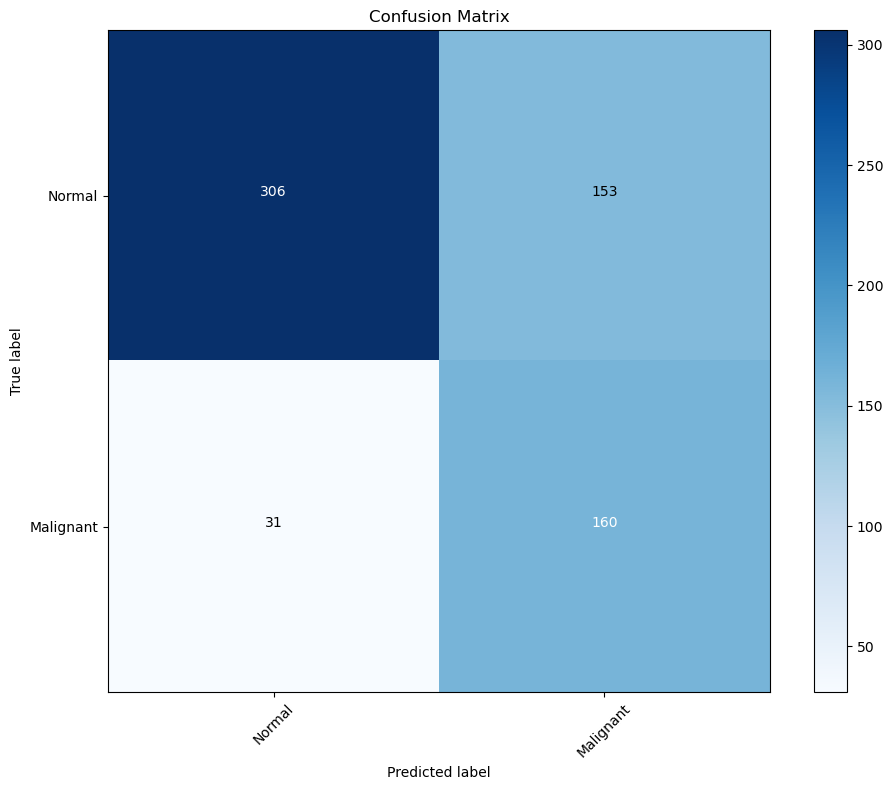

INFO:__main__:
Classification Report:
INFO:__main__:              precision    recall  f1-score   support

      Normal       0.91      0.67      0.77       459
   Malignant       0.51      0.84      0.63       191

    accuracy                           0.72       650
   macro avg       0.71      0.75      0.70       650
weighted avg       0.79      0.72      0.73       650



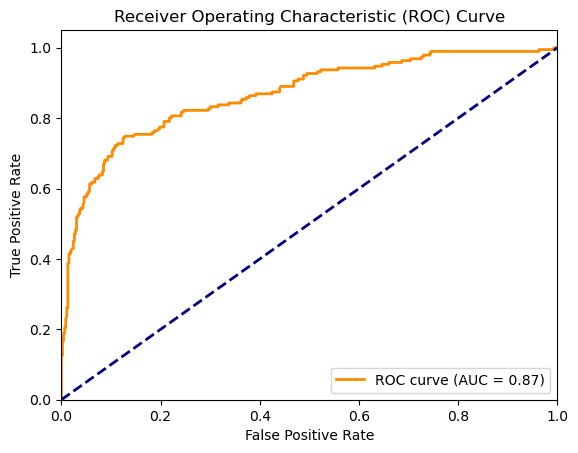

ERROR:__main__:Error occurred while processing google/vit-base-patch16-224: name 'precision_metric' is not defined


In [18]:
import logging
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from transformers import AutoModelForImageClassification, Trainer, TrainingArguments
from datasets import load_metric
import torch
from torch.utils.data import WeightedRandomSampler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Define the model name
MODEL_NAME = "google/vit-base-patch16-224"

def softmax(x):
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / e_x.sum(axis=1, keepdims=True)

def create_weighted_sampler(dataset):
    labels = [item['label'] for item in dataset]
    class_counts = np.bincount(labels)
    class_weights = 1. / class_counts
    weights = [class_weights[label] for label in labels]
    sampler = WeightedRandomSampler(weights, len(weights))
    return sampler

def compute_metrics(pred):
    labels = pred.label_ids
    logits = pred.predictions
    probs = softmax(logits)
    preds = probs.argmax(-1)

    precision_metric = load_metric("precision")
    recall_metric = load_metric("recall")
    f1_metric = load_metric("f1")
    accuracy_metric = load_metric("accuracy")

    precision = precision_metric.compute(predictions=preds, references=labels)["precision"]
    recall = recall_metric.compute(predictions=preds, references=labels)["recall"]
    f1 = f1_metric.compute(predictions=preds, references=labels)["f1"]
    accuracy = accuracy_metric.compute(predictions=preds, references=labels)["accuracy"]

    # Compute ROC AUC
    fpr, tpr, _ = roc_curve(labels, probs[:, 1])
    roc_auc = auc(fpr, tpr)

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc
    }

def create_and_train_model(train_dataset, val_dataset, test_dataset, num_epochs=10):
    model = AutoModelForImageClassification.from_pretrained(MODEL_NAME, num_labels=2, ignore_mismatched_sizes=True)

    # Create a weighted sampler for the training set
    sampler = create_weighted_sampler(train_dataset)

    training_args = TrainingArguments(
        output_dir=f'./results_{MODEL_NAME.split("/")[-1]}',
        num_train_epochs=num_epochs,
        per_device_train_batch_size=16,
        per_device_eval_batch_size=64,
        warmup_steps=500,
        weight_decay=0.01,
        logging_dir='./logs',
        logging_steps=10,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="recall",  # Focus on recall
        greater_is_better=True,
        report_to="none",
        learning_rate=2e-5,
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics,
    )

    trainer.train()

    # Evaluate on test set
    test_results = trainer.evaluate(test_dataset)
    
    return trainer, test_results

def plot_confusion_matrix(y_true, y_pred, classes):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

# Main execution
logger.info(f"Training and evaluating {MODEL_NAME}")
try:
    # Use the preprocessed datasets directly
    trainer, test_results = create_and_train_model(train_dataset, val_dataset, test_dataset)
    logger.info(f"Test results for {MODEL_NAME}:")
    logger.info(test_results)

    # Get predictions on test set
    test_pred = trainer.predict(test_dataset)
    y_true = test_pred.label_ids
    y_prob = softmax(test_pred.predictions)
    y_pred = y_prob.argmax(-1)

    # Plot confusion matrix
    plot_confusion_matrix(y_true, y_pred, classes=['Normal', 'Malignant'])

    # Print classification report
    logger.info("\nClassification Report:")
    logger.info(classification_report(y_true, y_pred, target_names=['Normal', 'Malignant']))

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Calculate metrics at different thresholds
    thresholds = np.arange(0, 1.01, 0.05)
    metrics = []
    for threshold in thresholds:
        y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)
        precision = precision_metric.compute(predictions=y_pred_threshold, references=y_true)["precision"]
        recall = recall_metric.compute(predictions=y_pred_threshold, references=y_true)["recall"]
        f1 = f1_metric.compute(predictions=y_pred_threshold, references=y_true)["f1"]
        accuracy = accuracy_metric.compute(predictions=y_pred_threshold, references=y_true)["accuracy"]
        metrics.append({'threshold': threshold, 'precision': precision, 'recall': recall, 'f1': f1, 'accuracy': accuracy})

    # Plot metrics vs threshold
    plt.figure(figsize=(12, 8))
    for metric in ['precision', 'recall', 'f1', 'accuracy']:
        plt.plot(thresholds, [m[metric] for m in metrics], label=metric)
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print the best threshold for each metric
    best_thresholds = {
        'precision': max(metrics, key=lambda x: x['precision']),
        'recall': max(metrics, key=lambda x: x['recall']),
        'f1': max(metrics, key=lambda x: x['f1']),
        'accuracy': max(metrics, key=lambda x: x['accuracy'])
    }

    logger.info("\nBest thresholds for each metric:")
    for metric, best in best_thresholds.items():
        logger.info(f"{metric.capitalize()}: Threshold = {best['threshold']:.2f}, {metric.capitalize()} = {best[metric]:.4f}")

    # Save the model
    trainer.save_model(f"./best_model_{MODEL_NAME.split('/')[-1]}")
    logger.info(f"Model saved to ./best_model_{MODEL_NAME.split('/')[-1]}")

except Exception as e:
    logger.error(f"Error occurred while processing {MODEL_NAME}: {str(e)}")

INFO:__main__:Evaluating google/vit-base-patch16-224 on test data


  0%|          | 0/82 [00:00<?, ?it/s]

INFO:__main__:
Overall Accuracy on Test Set: 0.8277
INFO:__main__:
Classification Report:
INFO:__main__:              precision    recall  f1-score   support

      Normal       0.88      0.87      0.88       459
   Malignant       0.70      0.72      0.71       191

    accuracy                           0.83       650
   macro avg       0.79      0.80      0.79       650
weighted avg       0.83      0.83      0.83       650



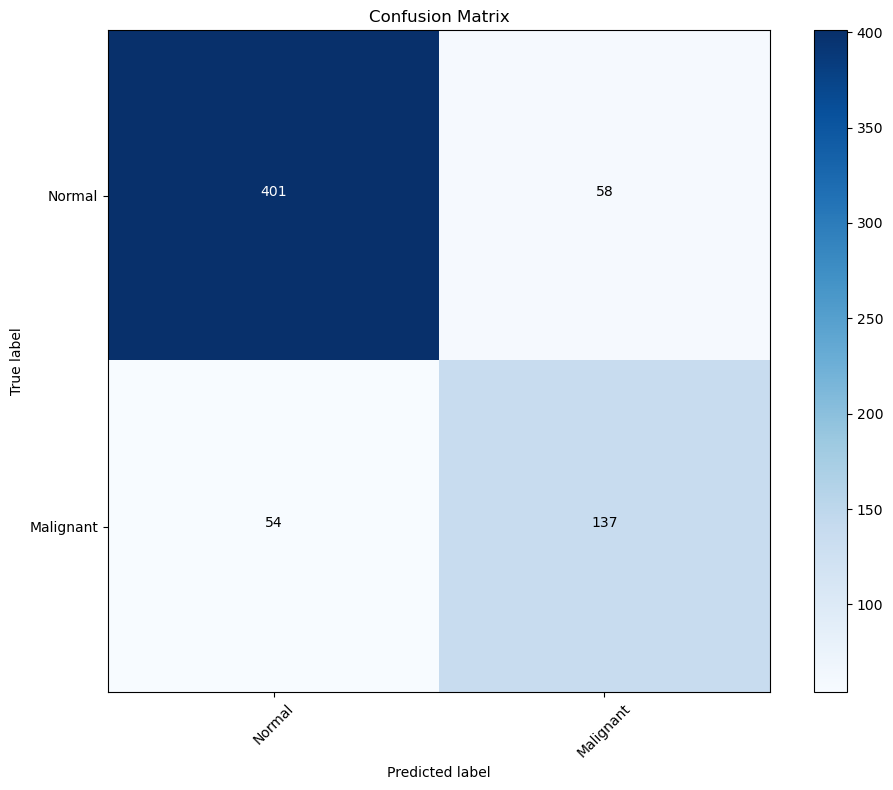

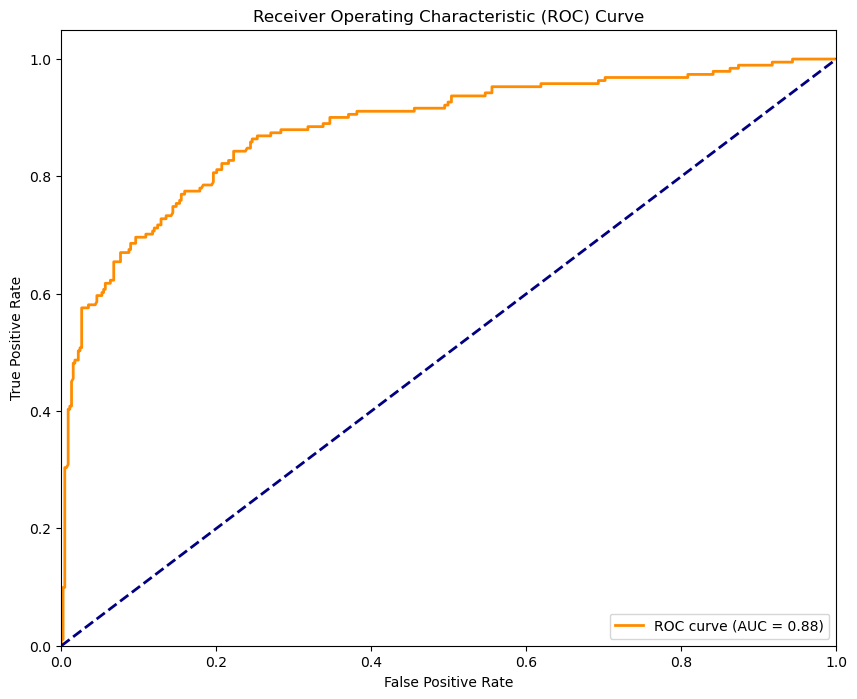

ERROR:__main__:Error occurred while processing google/vit-base-patch16-224: name 'precision_score' is not defined


In [19]:
# Main execution
logger.info(f"Evaluating {MODEL_NAME} on test data")
try:
    # Load the saved model
    model = AutoModelForImageClassification.from_pretrained(f"./best_model_{MODEL_NAME.split('/')[-1]}")
    
    # Create a trainer for prediction (no training)
    trainer = Trainer(model=model)

    # Get predictions on test set
    test_pred = trainer.predict(test_dataset)
    y_true = test_pred.label_ids
    y_prob = softmax(test_pred.predictions)
    y_pred = y_prob.argmax(-1)

    # Calculate and print overall accuracy
    accuracy = (y_true == y_pred).mean()
    logger.info(f"\nOverall Accuracy on Test Set: {accuracy:.4f}")

    # Print classification report
    logger.info("\nClassification Report:")
    logger.info(classification_report(y_true, y_pred, target_names=['Normal', 'Malignant']))

    # Plot confusion matrix
    plot_confusion_matrix(y_true, y_pred, classes=['Normal', 'Malignant'])

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Calculate metrics at different thresholds
    thresholds = np.arange(0, 1.01, 0.01)
    metrics = []
    for threshold in thresholds:
        y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)
        precision = precision_score(y_true, y_pred_threshold)
        recall = recall_score(y_true, y_pred_threshold)
        f1 = f1_score(y_true, y_pred_threshold)
        accuracy = accuracy_score(y_true, y_pred_threshold)
        specificity = specificity_score(y_true, y_pred_threshold)
        metrics.append({
            'threshold': threshold,
            'precision': precision,
            'recall': recall,
            'specificity': specificity,
            'f1': f1,
            'accuracy': accuracy
        })

    # Plot metrics vs threshold
    plt.figure(figsize=(12, 8))
    for metric in ['precision', 'recall', 'specificity', 'f1', 'accuracy']:
        plt.plot(thresholds, [m[metric] for m in metrics], label=metric)
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print the best threshold for each metric
    best_thresholds = {
        'precision': max(metrics, key=lambda x: x['precision']),
        'recall': max(metrics, key=lambda x: x['recall']),
        'specificity': max(metrics, key=lambda x: x['specificity']),
        'f1': max(metrics, key=lambda x: x['f1']),
        'accuracy': max(metrics, key=lambda x: x['accuracy'])
    }

    logger.info("\nBest thresholds for each metric:")
    for metric, best in best_thresholds.items():
        logger.info(f"{metric.capitalize()}: Threshold = {best['threshold']:.2f}, {metric.capitalize()} = {best[metric]:.4f}")

except Exception as e:
    logger.error(f"Error occurred while processing {MODEL_NAME}: {str(e)}")

INFO:__main__:Evaluating google/vit-base-patch16-224 on test data


  0%|          | 0/82 [00:00<?, ?it/s]

INFO:__main__:
Overall Accuracy on Test Set: 0.8277
INFO:__main__:
Classification Report:
INFO:__main__:              precision    recall  f1-score   support

      Normal       0.88      0.87      0.88       459
   Malignant       0.70      0.72      0.71       191

    accuracy                           0.83       650
   macro avg       0.79      0.80      0.79       650
weighted avg       0.83      0.83      0.83       650



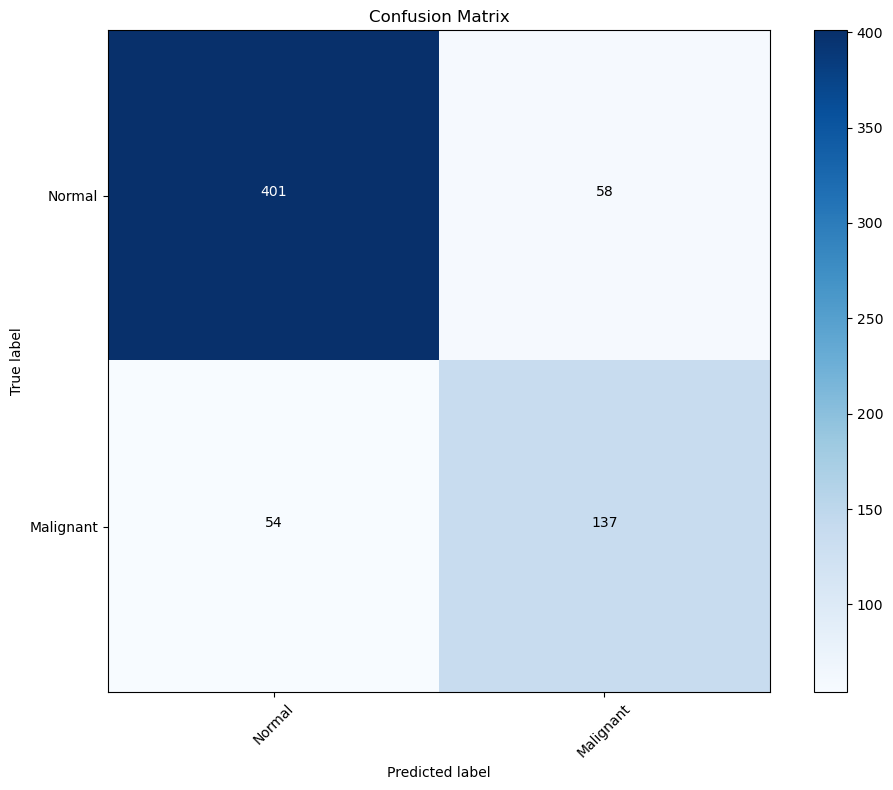

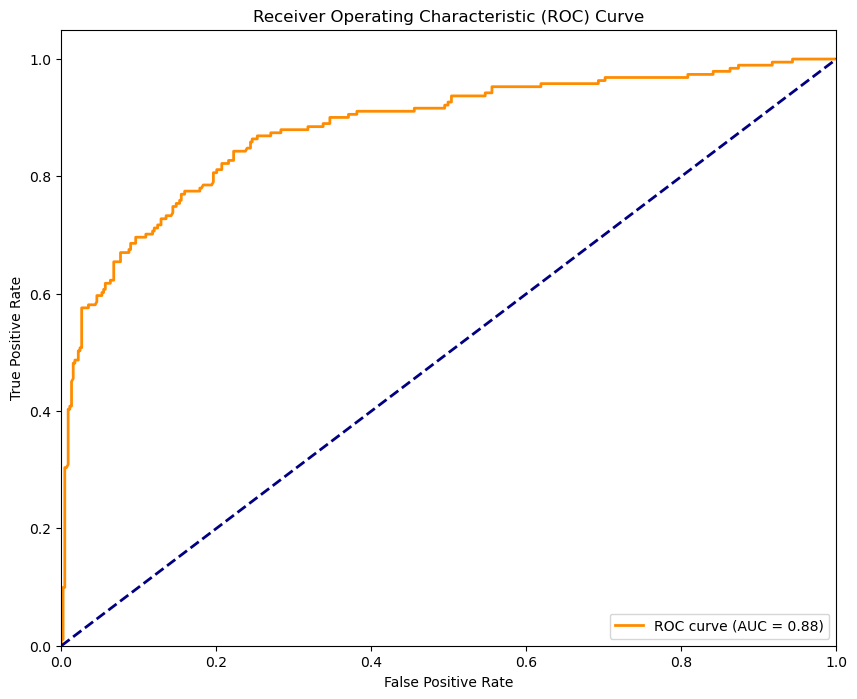

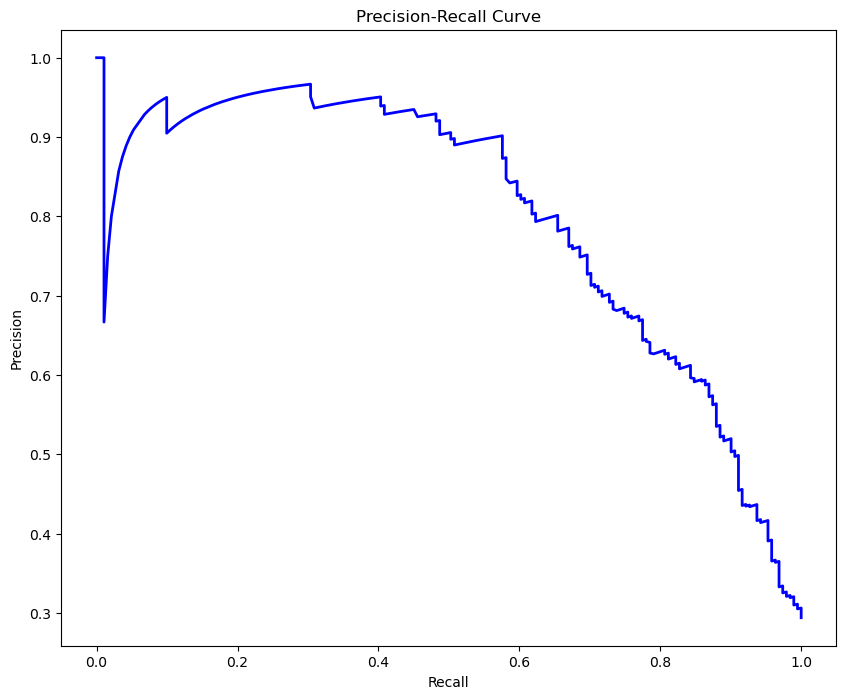

c:\Users\s0n0611\AppData\Local\anaconda3\envs\data_science_base_env\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
INFO:__main__:
Metrics at different thresholds:
INFO:__main__:Threshold  Precision     Recall   Specificity   F1-score    Accuracy  
INFO:__main__:   0.00      0.2938      1.0000      0.0000      0.4542      0.2938   
INFO:__main__:   0.05      0.6122      0.8429      0.7778      0.7093      0.7969   
INFO:__main__:   0.10      0.6250      0.8115      0.7974      0.7062      0.8015   
INFO:__main__:   0.15      0.6450      0.7801      0.8214      0.7062      0.8092   
INFO:__main__:   0.20      0.6667      0.7749      0.8388      0.7167      0.8200   
INFO:__main__:   0.25      0.6713      0.7592      0.8453      0.7125      0.8200   
IN

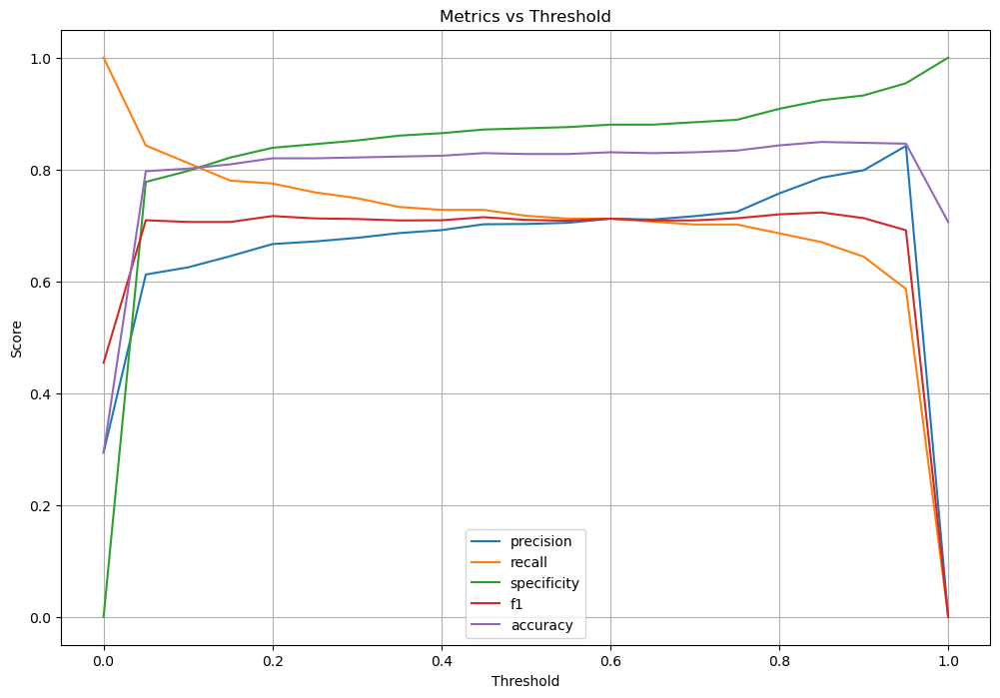

INFO:__main__:
Best thresholds for each metric:
INFO:__main__:Precision: Threshold = 0.95, Precision = 0.8421
INFO:__main__:Recall: Threshold = 0.00, Recall = 1.0000
INFO:__main__:Specificity: Threshold = 1.00, Specificity = 1.0000
INFO:__main__:F1: Threshold = 0.85, F1 = 0.7232
INFO:__main__:Accuracy: Threshold = 0.85, Accuracy = 0.8492


In [20]:
import logging
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_score, recall_score, f1_score, accuracy_score, precision_recall_curve
from transformers import AutoModelForImageClassification, Trainer

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Define the model name
MODEL_NAME = "google/vit-base-patch16-224"
SAVED_MODEL_PATH = f"./best_model_{MODEL_NAME.split('/')[-1]}"

def softmax(x):
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / e_x.sum(axis=1, keepdims=True)

def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp)

def plot_confusion_matrix(y_true, y_pred, classes):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

# Main execution
logger.info(f"Evaluating {MODEL_NAME} on test data")
try:
    # Load the saved model
    model = AutoModelForImageClassification.from_pretrained(SAVED_MODEL_PATH)
    
    # Create a trainer for prediction (no training)
    trainer = Trainer(model=model)

    # Get predictions on test set
    test_pred = trainer.predict(test_dataset)
    y_true = test_pred.label_ids
    y_prob = softmax(test_pred.predictions)
    y_pred = y_prob.argmax(-1)

    # Calculate and print overall accuracy
    accuracy = (y_true == y_pred).mean()
    logger.info(f"\nOverall Accuracy on Test Set: {accuracy:.4f}")

    # Print classification report
    logger.info("\nClassification Report:")
    logger.info(classification_report(y_true, y_pred, target_names=['Normal', 'Malignant']))

    # Plot confusion matrix
    plot_confusion_matrix(y_true, y_pred, classes=['Normal', 'Malignant'])

    # Plot ROC curve
    fpr, tpr, roc_thresholds = roc_curve(y_true, y_prob[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Plot Precision-Recall curve
    precision, recall, pr_thresholds = precision_recall_curve(y_true, y_prob[:, 1])
    plt.figure(figsize=(10, 8))
    plt.plot(recall, precision, color='blue', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

    # Calculate metrics at different thresholds
    thresholds = np.arange(0, 1.01, 0.05)
    metrics = []
    for threshold in thresholds:
        y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)
        precision = precision_score(y_true, y_pred_threshold)
        recall = recall_score(y_true, y_pred_threshold)
        specificity = specificity_score(y_true, y_pred_threshold)
        f1 = f1_score(y_true, y_pred_threshold)
        accuracy = accuracy_score(y_true, y_pred_threshold)
        metrics.append({
            'threshold': threshold,
            'precision': precision,
            'recall': recall,
            'specificity': specificity,
            'f1': f1,
            'accuracy': accuracy
        })

    # Print metrics at different thresholds
    logger.info("\nMetrics at different thresholds:")
    logger.info(f"{'Threshold':^10}{'Precision':^12}{'Recall':^12}{'Specificity':^12}{'F1-score':^12}{'Accuracy':^12}")
    for m in metrics:
        logger.info(f"{m['threshold']:^10.2f}{m['precision']:^12.4f}{m['recall']:^12.4f}{m['specificity']:^12.4f}{m['f1']:^12.4f}{m['accuracy']:^12.4f}")

    # Plot metrics vs threshold
    plt.figure(figsize=(12, 8))
    for metric in ['precision', 'recall', 'specificity', 'f1', 'accuracy']:
        plt.plot(thresholds, [m[metric] for m in metrics], label=metric)
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print the best threshold for each metric
    best_thresholds = {
        'precision': max(metrics, key=lambda x: x['precision']),
        'recall': max(metrics, key=lambda x: x['recall']),
        'specificity': max(metrics, key=lambda x: x['specificity']),
        'f1': max(metrics, key=lambda x: x['f1']),
        'accuracy': max(metrics, key=lambda x: x['accuracy'])
    }

    logger.info("\nBest thresholds for each metric:")
    for metric, best in best_thresholds.items():
        logger.info(f"{metric.capitalize()}: Threshold = {best['threshold']:.2f}, {metric.capitalize()} = {best[metric]:.4f}")

except Exception as e:
    logger.error(f"Error occurred while processing {MODEL_NAME}: {str(e)}")

INFO:__main__:Evaluating google/vit-base-patch16-224 on test data
INFO:__main__:
Results for threshold 0.1:
INFO:__main__:Confusion Matrix:
INFO:__main__:TN: 366 (56.31%)
INFO:__main__:FP: 93 (14.31%)
INFO:__main__:FN: 36 (5.54%)
INFO:__main__:TP: 155 (23.85%)
INFO:__main__:
Detailed Metrics:
INFO:__main__:Accuracy: 0.8015
INFO:__main__:Precision: 0.6250
INFO:__main__:Recall (Sensitivity): 0.8115
INFO:__main__:Specificity: 0.7974
INFO:__main__:F1-score: 0.7062


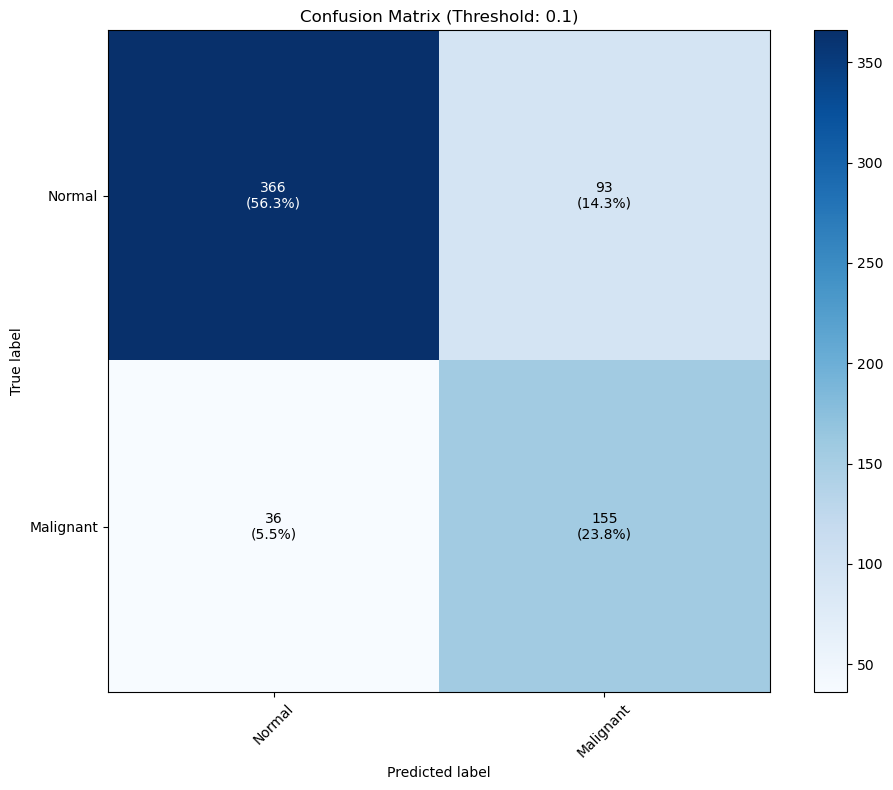

In [22]:
# ... (previous code remains the same)

# Main execution
logger.info(f"Evaluating {MODEL_NAME} on test data")
try:
    # ... (loading model and getting predictions)

    # Set threshold
    threshold = 0.10
    y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred_threshold)
    tn, fp, fn, tp = cm.ravel()

    # Calculate total samples
    total_samples = tn + fp + fn + tp

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred_threshold)
    precision = precision_score(y_true, y_pred_threshold)
    recall = recall_score(y_true, y_pred_threshold)
    specificity = tn / (tn + fp)
    f1 = f1_score(y_true, y_pred_threshold)

    # Print results
    logger.info(f"\nResults for threshold {threshold}:")
    logger.info(f"Confusion Matrix:")
    logger.info(f"TN: {tn} ({tn/total_samples:.2%})")
    logger.info(f"FP: {fp} ({fp/total_samples:.2%})")
    logger.info(f"FN: {fn} ({fn/total_samples:.2%})")
    logger.info(f"TP: {tp} ({tp/total_samples:.2%})")

    logger.info(f"\nDetailed Metrics:")
    logger.info(f"Accuracy: {accuracy:.4f}")
    logger.info(f"Precision: {precision:.4f}")
    logger.info(f"Recall (Sensitivity): {recall:.4f}")
    logger.info(f"Specificity: {specificity:.4f}")
    logger.info(f"F1-score: {f1:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix (Threshold: {threshold})')
    plt.colorbar()
    classes = ['Normal', 'Malignant']
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], fmt) + f'\n({cm[i, j]/total_samples:.1%})',
                 horizontalalignment="center",
                 verticalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

    # ... (rest of the code)

except Exception as e:
    logger.error(f"Error occurred while processing {MODEL_NAME}: {str(e)}")

INFO:__main__:Number of false negatives: 36
INFO:__main__:
False Negative Analysis:
INFO:__main__:Mean probability for malignant class: 0.0232
INFO:__main__:Min probability for malignant class: 0.0013
INFO:__main__:Max probability for malignant class: 0.0951
INFO:__main__:
True Positive Analysis (for comparison):
INFO:__main__:Mean probability for malignant class: 0.8814
INFO:__main__:Min probability for malignant class: 0.1056
INFO:__main__:Max probability for malignant class: 0.9988


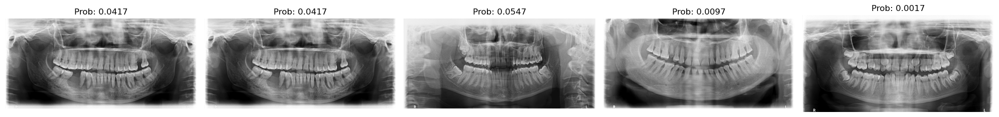

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Identify false negatives
false_negatives = np.where((y_true == 1) & (y_pred_threshold == 0))[0]

logger.info(f"Number of false negatives: {len(false_negatives)}")

# Extract misclassified samples
fn_samples = [test_dataset[int(i)] for i in false_negatives]  # Convert numpy.int64 to int

# Analyze features
fn_probabilities = y_prob[false_negatives, 1]

logger.info("\nFalse Negative Analysis:")
logger.info(f"Mean probability for malignant class: {fn_probabilities.mean():.4f}")
logger.info(f"Min probability for malignant class: {fn_probabilities.min():.4f}")
logger.info(f"Max probability for malignant class: {fn_probabilities.max():.4f}")

# Compare with correctly classified malignant samples
true_positives = np.where((y_true == 1) & (y_pred_threshold == 1))[0]
tp_probabilities = y_prob[true_positives, 1]

logger.info("\nTrue Positive Analysis (for comparison):")
logger.info(f"Mean probability for malignant class: {tp_probabilities.mean():.4f}")
logger.info(f"Min probability for malignant class: {tp_probabilities.min():.4f}")
logger.info(f"Max probability for malignant class: {tp_probabilities.max():.4f}")

# Visualize some misclassified images
def plot_misclassified_samples(samples, probabilities, num_samples=5):
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    for i, (sample, prob) in enumerate(zip(samples[:num_samples], probabilities[:num_samples])):
        img = sample['image']
        if isinstance(img, Image.Image):
            axes[i].imshow(img)
        else:
            axes[i].imshow(img.permute(1, 2, 0))  # Assuming the image is a tensor
        axes[i].set_title(f"Prob: {prob:.4f}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

plot_misclassified_samples(fn_samples, fn_probabilities)

# Additional analysis: Check for any patterns in misclassifications
# For example, you could look at metadata if available
if 'metadata' in fn_samples[0]:
    metadata_keys = fn_samples[0]['metadata'].keys()
    for key in metadata_keys:
        values = [sample['metadata'][key] for sample in fn_samples]
        logger.info(f"\nDistribution of {key} in false negatives:")
        logger.info(np.unique(values, return_counts=True))

# If you have feature importances or attention weights, analyze them
# This is model-specific and would require additional code based on your model architecture

INFO:__main__:Displaying Normal (Benign) Images:


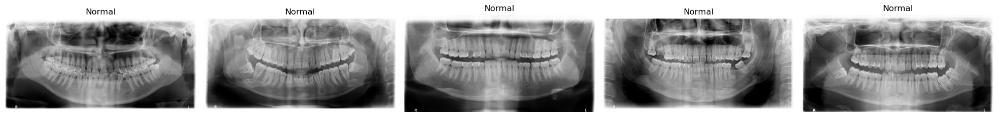

INFO:__main__:Displaying Malignant Images:


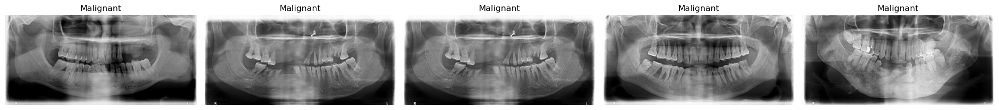

INFO:__main__:
Metadata for Normal samples:
INFO:__main__:Sample 1:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 2:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 3:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 4:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 5:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:
Metadata for Malignant samples:
INFO:__main__:Sample 1:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 2:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 3:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 4:
INFO:__main__:  No metadata available
INFO:__main__:
INFO:__main__:Sample 5:
INFO:__main__:  No metadata available
INFO:__main__:


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def plot_samples(dataset, labels, class_label, num_samples=5):
    class_indices = np.where(labels == class_label)[0]
    samples = [dataset[int(i)] for i in class_indices[:num_samples]]
    
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    for i, sample in enumerate(samples):
        img = sample['image']
        if isinstance(img, Image.Image):
            axes[i].imshow(img)
        elif isinstance(img, np.ndarray):
            axes[i].imshow(img)
        else:  # Assuming it's a tensor
            axes[i].imshow(img.permute(1, 2, 0))
        axes[i].set_title(f"{'Normal' if class_label == 0 else 'Malignant'}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Plot normal (benign) images
logger.info("Displaying Normal (Benign) Images:")
plot_samples(test_dataset, y_true, class_label=0)

# Plot malignant images
logger.info("Displaying Malignant Images:")
plot_samples(test_dataset, y_true, class_label=1)

# Additional analysis: Print some metadata if available
def print_sample_metadata(dataset, labels, class_label, num_samples=5):
    class_indices = np.where(labels == class_label)[0]
    samples = [dataset[int(i)] for i in class_indices[:num_samples]]
    
    logger.info(f"\nMetadata for {'Normal' if class_label == 0 else 'Malignant'} samples:")
    for i, sample in enumerate(samples):
        logger.info(f"Sample {i+1}:")
        if 'metadata' in sample:
            for key, value in sample['metadata'].items():
                logger.info(f"  {key}: {value}")
        else:
            logger.info("  No metadata available")
        logger.info("")

# Print metadata for normal samples
print_sample_metadata(test_dataset, y_true, class_label=0)

# Print metadata for malignant samples
print_sample_metadata(test_dataset, y_true, class_label=1)